In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [3]:
path = "arguments-training.tsv"
df = pd.read_table(path, sep = "\t")
df.head()

,Argument ID,Conclusion,Stance,Premise
0,A01002,We should ban human cloning,in favor of,we should ban human cloning as it will only ca...
1,A01005,We should ban fast food,in favor of,fast food should be banned because it is reall...
2,A01006,We should end the use of economic sanctions,against,sometimes economic sanctions are the only thin...
3,A01007,We should abolish capital punishment,against,capital punishment is sometimes the only optio...
4,A01008,We should ban factory farming,against,factory farming allows for the production of c...


In [4]:
# renaming the Argument ID column so that there is no space
df.rename(columns={"Argument ID": "Argument_ID"}, inplace=True)

In [5]:
l_path = "labels-training.tsv"
temp_labels_df = pd.read_table(l_path, sep="\t")
temp_labels_df.head()

,Argument ID,Self-direction: thought,Self-direction: action,Stimulation,Hedonism,Achievement,Power: dominance,Power: resources,Face,Security: personal,...,Tradition,Conformity: rules,Conformity: interpersonal,Humility,Benevolence: caring,Benevolence: dependability,Universalism: concern,Universalism: nature,Universalism: tolerance,Universalism: objectivity
0,A01002,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,A01005,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
2,A01006,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,A01007,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
4,A01008,0,0,0,0,0,0,0,0,1,...,0,0,0,0,1,0,1,0,0,0


In [6]:
# renaming the Argument ID column so that there is no space
temp_labels_df.rename(columns={"Argument ID": "Argument_ID"}, inplace=True)

In [7]:
pd.set_option('display.max_columns', None)
temp_labels_df.head()

,Argument_ID,Self-direction: thought,Self-direction: action,Stimulation,Hedonism,Achievement,Power: dominance,Power: resources,Face,Security: personal,Security: societal,Tradition,Conformity: rules,Conformity: interpersonal,Humility,Benevolence: caring,Benevolence: dependability,Universalism: concern,Universalism: nature,Universalism: tolerance,Universalism: objectivity
0,A01002,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,A01005,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,A01006,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0
3,A01007,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0
4,A01008,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0


## data preparation

In [8]:
# label the data using a common identifier
training_data=pd.merge(df, temp_labels_df, on="Argument_ID")

In [9]:
training_data

,Argument_ID,Conclusion,Stance,Premise,Self-direction: thought,Self-direction: action,Stimulation,Hedonism,Achievement,Power: dominance,Power: resources,Face,Security: personal,Security: societal,Tradition,Conformity: rules,Conformity: interpersonal,Humility,Benevolence: caring,Benevolence: dependability,Universalism: concern,Universalism: nature,Universalism: tolerance,Universalism: objectivity
0,A01002,We should ban human cloning,in favor of,we should ban human cloning as it will only ca...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,A01005,We should ban fast food,in favor of,fast food should be banned because it is reall...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,A01006,We should end the use of economic sanctions,against,sometimes economic sanctions are the only thin...,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0
3,A01007,We should abolish capital punishment,against,capital punishment is sometimes the only optio...,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0
4,A01008,We should ban factory farming,against,factory farming allows for the production of c...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5388,E08016,The EU should integrate the armed forces of it...,in favor of,"On the one hand, we have Russia killing countl...",0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0
5389,E08017,Food whose production has been subsidized with...,in favor of,The subsidies were originally intended to ensu...,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,1,0,0,1
5390,E08018,Food whose production has been subsidized with...,in favor of,These products come mainly from large enterpri...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
5391,E08019,Food whose production has been subsidized with...,in favor of,Subsidies often make farmers in recipient coun...,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,1,1,0,0,1


## text preprocessing

In [10]:
import spacy

nlp=spacy.load("en_core_web_sm")

def preprocess_text(text):
    doc=nlp(text)
    # set lowercase and remove punctuation
    processed_text=" ".join([token.text.lower() for token in doc if not token.is_punct])
    return processed_text

# Apply text preprocessing to your text data
training_data["processed_text"]=training_data["Premise"].apply(preprocess_text)


In [11]:
training_data

,Argument_ID,Conclusion,Stance,Premise,Self-direction: thought,Self-direction: action,Stimulation,Hedonism,Achievement,Power: dominance,Power: resources,Face,Security: personal,Security: societal,Tradition,Conformity: rules,Conformity: interpersonal,Humility,Benevolence: caring,Benevolence: dependability,Universalism: concern,Universalism: nature,Universalism: tolerance,Universalism: objectivity,processed_text
0,A01002,We should ban human cloning,in favor of,we should ban human cloning as it will only ca...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,we should ban human cloning as it will only ca...
1,A01005,We should ban fast food,in favor of,fast food should be banned because it is reall...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,fast food should be banned because it is reall...
2,A01006,We should end the use of economic sanctions,against,sometimes economic sanctions are the only thin...,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,sometimes economic sanctions are the only thin...
3,A01007,We should abolish capital punishment,against,capital punishment is sometimes the only optio...,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,capital punishment is sometimes the only optio...
4,A01008,We should ban factory farming,against,factory farming allows for the production of c...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,factory farming allows for the production of c...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5388,E08016,The EU should integrate the armed forces of it...,in favor of,"On the one hand, we have Russia killing countl...",0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,on the one hand we have russia killing countle...
5389,E08017,Food whose production has been subsidized with...,in favor of,The subsidies were originally intended to ensu...,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,1,0,0,1,the subsidies were originally intended to ensu...
5390,E08018,Food whose production has been subsidized with...,in favor of,These products come mainly from large enterpri...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,these products come mainly from large enterpri...
5391,E08019,Food whose production has been subsidized with...,in favor of,Subsidies often make farmers in recipient coun...,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,1,1,0,0,1,subsidies often make farmers in recipient coun...


In [12]:
for feature in training_data:
    print(feature)

Argument_ID
Conclusion
Stance
Premise
Self-direction: thought
Self-direction: action
Stimulation
Hedonism
Achievement
Power: dominance
Power: resources
Face
Security: personal
Security: societal
Tradition
Conformity: rules
Conformity: interpersonal
Humility
Benevolence: caring
Benevolence: dependability
Universalism: concern
Universalism: nature
Universalism: tolerance
Universalism: objectivity
processed_text


## transform labels into probabilities

In [13]:

# extract the label columns and store them in a separate DataFrame
label_columns=training_data[["Self-direction: thought",
"Self-direction: action",
"Stimulation",
"Hedonism",
"Achievement",
"Power: dominance",
"Power: resources",
"Face",
"Security: personal",
"Security: societal",
"Tradition",
"Conformity: rules",
"Conformity: interpersonal",
"Humility",
"Benevolence: caring",
"Benevolence: dependability",
"Universalism: concern",
"Universalism: nature",
"Universalism: tolerance",
"Universalism: objectivity"]]

# convert the label columns to a multi-class format (one-hot encoding)
training_data['label'] = label_columns.apply(lambda row: row.to_list(), axis=1)


In [14]:
# found a row with no labels

training_data.iloc[3358]

Argument_ID                                                              A26098
Conclusion                                 We should adopt a multi-party system
Stance                                                                  against
Premise                       a multi-party system offers too many options a...
Self-direction: thought                                                       0
Self-direction: action                                                        0
Stimulation                                                                   0
Hedonism                                                                      0
Achievement                                                                   0
Power: dominance                                                              0
Power: resources                                                              0
Face                                                                          0
Security: personal                      

In [15]:
# drop the row with no labels

training_data.drop(index=3358, inplace=True)

In [16]:
training_data["label"]

0       [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, ...
1       [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, ...
2       [0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, ...
3       [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, ...
4       [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, ...
                              ...                        
5388    [0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, ...
5389    [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, ...
5390    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
5391    [0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, ...
5392    [0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, ...
Name: label, Length: 5392, dtype: object

In [17]:
# reset the row indices
training_data=training_data.reset_index(drop=True)

#print(training_data)


In [18]:
labels=list(training_data["label"])

In [19]:
final=[]

for sublist in labels:
    sum_values=sum(sublist)
    probability_distribution=[value/sum_values for value in sublist]
    final.append(probability_distribution)

In [20]:
training_data["label"]=final

In [21]:
training_data

,Argument_ID,Conclusion,Stance,Premise,Self-direction: thought,Self-direction: action,Stimulation,Hedonism,Achievement,Power: dominance,Power: resources,Face,Security: personal,Security: societal,Tradition,Conformity: rules,Conformity: interpersonal,Humility,Benevolence: caring,Benevolence: dependability,Universalism: concern,Universalism: nature,Universalism: tolerance,Universalism: objectivity,processed_text,label
0,A01002,We should ban human cloning,in favor of,we should ban human cloning as it will only ca...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,we should ban human cloning as it will only ca...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1,A01005,We should ban fast food,in favor of,fast food should be banned because it is reall...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,fast food should be banned because it is reall...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ..."
2,A01006,We should end the use of economic sanctions,against,sometimes economic sanctions are the only thin...,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,sometimes economic sanctions are the only thin...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.5, 0.0, 0.0, 0.0, ..."
3,A01007,We should abolish capital punishment,against,capital punishment is sometimes the only optio...,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,capital punishment is sometimes the only optio...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
4,A01008,We should ban factory farming,against,factory farming allows for the production of c...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,factory farming allows for the production of c...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.333..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5387,E08016,The EU should integrate the armed forces of it...,in favor of,"On the one hand, we have Russia killing countl...",0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,on the one hand we have russia killing countle...,"[0.0, 0.0, 0.0, 0.0, 0.25, 0.25, 0.0, 0.0, 0.0..."
5388,E08017,Food whose production has been subsidized with...,in favor of,The subsidies were originally intended to ensu...,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,1,0,0,1,the subsidies were originally intended to ensu...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2, ..."
5389,E08018,Food whose production has been subsidized with...,in favor of,These products come mainly from large enterpri...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,these products come mainly from large enterpri...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
5390,E08019,Food whose production has been subsidized with...,in favor of,Subsidies often make farmers in recipient coun...,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,1,1,0,0,1,subsidies often make farmers in recipient coun...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.166..."


## spacy

In [22]:
import spacy

In [23]:
nlp=spacy.load("en_core_web_sm")

In [24]:
doc=nlp(training_data["processed_text"][5387])

In [25]:
print(doc)

on the one hand we have russia killing countless ukrainians and committing sabotage in britain and the czech republic and on the other hand we have reluctant united states that is switching between isolationist and interventionist policies every 4 8 years    i stand convinced that in order for the european union to move forward it must begin to introduce measures for the security of both the current member states as well as the future member states that are endangered due to foreign aggression and bring the responsibility of continental safety firmly in our own hands if europe is to find the peace it must have the means to create peace by being able to protect itself against hostile foreign influences


In [26]:
ents=list(doc.ents) #check for entities in the argument

In [27]:
ents

[russia, britain, the czech republic, 4 8 years, the european union, europe]

In [28]:
# get POS

for token in doc:
    print(token.text, token.pos_)

on ADP
the DET
one NUM
hand NOUN
we PRON
have VERB
russia PROPN
killing VERB
countless ADJ
ukrainians NOUN
and CCONJ
committing VERB
sabotage NOUN
in ADP
britain PROPN
and CCONJ
the DET
czech PROPN
republic PROPN
and CCONJ
on ADP
the DET
other ADJ
hand NOUN
we PRON
have VERB
reluctant ADJ
united PROPN
states PROPN
that PRON
is AUX
switching VERB
between ADP
isolationist NOUN
and CCONJ
interventionist ADJ
policies NOUN
every DET
4 NUM
8 NUM
years NOUN
    SPACE
i PRON
stand VERB
convinced VERB
that SCONJ
in ADP
order NOUN
for SCONJ
the DET
european PROPN
union PROPN
to PART
move VERB
forward ADV
it PRON
must AUX
begin VERB
to PART
introduce VERB
measures NOUN
for ADP
the DET
security NOUN
of ADP
both PRON
the DET
current ADJ
member NOUN
states NOUN
as ADV
well ADV
as ADP
the DET
future ADJ
member NOUN
states NOUN
that PRON
are AUX
endangered VERB
due ADP
to ADP
foreign ADJ
aggression NOUN
and CCONJ
bring VERB
the DET
responsibility NOUN
of ADP
continental ADJ
safety NOUN
firmly ADV
in A

In [49]:
nouns=[]

for i in range(training_data.shape[0]):
    doc=nlp(training_data["processed_text"][i])
    temporary=[]
    for token in doc:
        if token.pos_=="NOUN":
            temporary.append(token)
    nouns.append(temporary)
            
print(nouns)

[[cloning, issues, bunch, humans], [food, health], [sanctions, thing, governments, action], [punishment, option, criminals, crimes], [factory, farming, production, food, necessity, families, income], [weapons, peace, times], [student, classes], [strike, laws, people, life, chance, life], [austerity, regime, impact, society], [austerity, regime, generations, debts], [gender, language, way, group, sexes, men, women, use, words], [sanctions, sanction, countries], [factory, farming, health, safety, corners, family, farms, products], [news, organizations, forms, media, internet, subsidization], [parades, group, discrimination, gays, parade], [children, adult, surgery, child, adult, child, choice, bodies, whim, child], [prostitution, females], [stem, cell, research, development, treatments, number, conditions], [algorithms, situation, market], [organ, trade, people, law, organs, form, times], [drugs, floodgates, legalization, drugs], [weapons, threat, world], [telemarketing, people], [school

In [30]:
noun_chunks=[]

for i in range(training_data.shape[0]):
    doc=nlp(training_data["processed_text"][i])
    noun_chunks.append(list(doc.noun_chunks))
            
print(noun_chunks)

[[we, human cloning, it, huge issues, you, a bunch, the same humans, all], [fast food, it, your health], [economic sanctions, the only thing, that, the corrupt governments, action], [capital punishment, the only option, criminals, more crimes], [factory farming, the production, cheap food, which, a necessity, families, a low income], [nuclear weapons, the peace, uncertain times], [it, the student, it, his classes], [three strike laws, young people, life, a chance, their life], [austerity regime, very negative impact, society], [we, an austerity regime, it, future generations, the debts, we], [gender neutral language, just another way, a group, we, two sexes men, women, they, the use, words], [economic sanctions, a non military sanction, countries], [factory farming, too many health and safety corners, smaller family farms, this, potentially unsafe and unhealthy products], [it, news organizations, new forms, media, the internet, it, subsidization], [parades, every group, it, discriminat

In [31]:
# lemmatization of verbs

verbs={}

for i in range(training_data.shape[0]):
    doc=nlp(training_data["processed_text"][i])
    for word in doc:
        if word.pos_=="VERB":
            print(word, word.lemma_)
            if word in verbs:
                verbs[word.lemma_] += 1
            else:
                verbs[word.lemma_] = 1
                
print(verbs)
    

ban ban
cause cause
have have
running run
acting act
banned ban
get get
take take
keep keep
committing commit
allows allow
surviving survive
help help
keep keep
allowed allow
wants want
pray pray
interfering interfere
cause cause
put put
straight straight
adopting adopt
have have
adopt adopt
expect expect
settle settle
run run
try try
please please
have have
provide provide
use use
cuts cut
opposed oppose
leads lead
transfer transfer
requires require
are be
give give
grown grow
formed form
looks look
banned ban
make make
legalize legalize
regulated regulate
meaning mean
subsidized subsidize
lead lead
reflect reflect
legalize legalize
punished punish
obeying obey
purchasing purchase
wait wait
start start
legalizing legalize
open open
pose pose
abolish abolish
differentiate differentiate
called call
account account
hold hold
abolish abolish
keep keep
bear bear
has have
keep keep
stated state
manipulate manipulate
need need
donate donate
legalizing legalize
requires require
support suppor

In [32]:
keys=list(verbs.keys())

In [33]:
print(sorted(keys))

["'", '9th', 'abandon', 'abate', 'abide', 'abolish', 'abort', 'abound', 'abscond', 'abstain', 'abuse', 'accelerate', 'accept', 'access', 'accommodate', 'accompany', 'accomplish', 'accord', 'account', 'accredit', 'accrue', 'accumulate', 'accuse', 'acheive', 'achieve', 'acknowledge', 'acquire', 'act', 'adapt', 'add', 'addict', 'address', 'adhere', 'adjust', 'administer', 'admit', 'adobt', 'adoppte', 'adopt', 'advance', 'advertise', 'advocate', 'affect', 'affirm', 'afford', 'age', 'aggravate', 'agree', 'ai', 'aid', 'aim', 'airbrush', 'airplane', 'algorithm', 'alienate', 'alleviate', 'allocate', 'allot', 'allow', 'alter', 'amass', 'amount', 'amputate', 'amuse', 'analyze', 'anonymize', 'answer', 'ant', 'antagonise', 'antagonize', 'anticipate', 'antiquate', 'appeal', 'appear', 'apply', 'appoint', 'appreciate', 'approach', 'appropriate', 'approve', 'are', 'argue', 'arise', 'arm', 'arrange', 'arrest', 'arrive', 'ask', 'aspire', 'assassinate', 'assess', 'assign', 'assist', 'associate', 'assume'

In [34]:

# Part-of-speech tagging
pos_tags = [(token.text, token.pos_) for token in doc]

In [35]:
tokens=[]

for i in range(training_data.shape[0]):
    doc=nlp(training_data["processed_text"][i])
    for token in doc:
        tokens.append(token)

In [36]:
print(tokens)

[we, should, ban, human, cloning, as, it, will, only, cause, huge, issues, when, you, have, a, bunch, of, the, same, humans, running, around, all, acting, the, same, fast, food, should, be, banned, because, it, is, really, bad, for, your, health, and, is, costly, sometimes, economic, sanctions, are, the, only, thing, that, will, get, the, corrupt, governments, to, take, action, capital, punishment, is, sometimes, the, only, option, to, keep, criminals, from, committing, more, crimes, factory, farming, allows, for, the, production, of, cheap, food, which, is, a, necessity, for, families, surviving, on, a, low, income, nuclear, weapons, help, keep, the, peace, in, uncertain, times, it, should, be, allowed, if, the, student, wants, to, pray, as, long, as, it, is, not, interfering, with, his, classes, three, strike, laws, can, cause, young, people, to, be, put, away, for, life, without, a, chance, to, straight, out, their, life, adopting, austerity, regime, will, have, very, negative, impa

In [37]:
# removing stop words

filtered_tokens=[]

for token in tokens:
    if not token.is_stop:
        filtered_tokens.append(token)

In [38]:
print(filtered_tokens)

[ban, human, cloning, cause, huge, issues, bunch, humans, running, acting, fast, food, banned, bad, health, costly, economic, sanctions, thing, corrupt, governments, action, capital, punishment, option, criminals, committing, crimes, factory, farming, allows, production, cheap, food, necessity, families, surviving, low, income, nuclear, weapons, help, peace, uncertain, times, allowed, student, wants, pray, long, interfering, classes, strike, laws, cause, young, people, away, life, chance, straight, life, adopting, austerity, regime, negative, impact, poor, vulnerable, society, adopt, austerity, regime, unfair, expect, future, generations, settle, debts, run, gender, neutral, language, way, try, group,   , sexes, men, women, differentiate, use, words, economic, sanctions, provide, non, military, sanction, use, countries, factory, farming, cuts, health, safety, corners, opposed, smaller, family, farms, leads, potentially, unsafe, unhealthy, products, important, news, organizations, trans

In [39]:
# visualization of data

pos=[]

for token in filtered_tokens:
    pos.append(token.pos_)

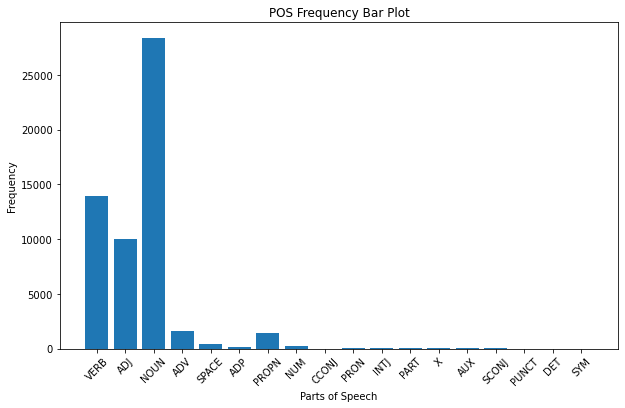

In [40]:
import matplotlib.pyplot as plt
from collections import Counter

pos_counts = Counter(pos)

words, frequencies = zip(*pos_counts.items())

plt.figure(figsize=(10, 6)) 
plt.bar(words, frequencies)

plt.xlabel('Parts of Speech')
plt.ylabel('Frequency')
plt.title('POS Frequency Bar Plot')

plt.xticks(rotation=45)

plt.show()


In [41]:
ent_labels=[]

for i in range(training_data.shape[0]):
    doc=nlp(training_data["processed_text"][i])
    for ent in doc.ents:
        ent_labels.append(ent.label_)

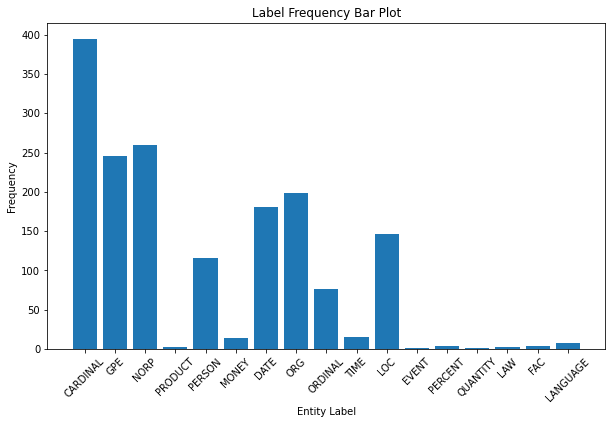

In [42]:
ents_counts = Counter(ent_labels)

words, frequencies = zip(*ents_counts.items())

plt.figure(figsize=(10, 6)) 
plt.bar(words, frequencies)

plt.xlabel('Entity Label')
plt.ylabel('Frequency')
plt.title('Label Frequency Bar Plot')

plt.xticks(rotation=45)

plt.show()

In [43]:
from spacy import displacy

In [44]:
doc=nlp(training_data["processed_text"][0])

html=displacy.render(doc, style="dep")

## vectorization

In [58]:
nouns

[['cloning', 'issues', 'bunch', 'humans'],
 ['food', 'health'],
 ['sanctions', 'thing', 'governments', 'action'],
 ['punishment', 'option', 'criminals', 'crimes'],
 ['factory',
  'farming',
  'production',
  'food',
  'necessity',
  'families',
  'income'],
 ['weapons', 'peace', 'times'],
 ['student', 'classes'],
 ['strike', 'laws', 'people', 'life', 'chance', 'life'],
 ['austerity', 'regime', 'impact', 'society'],
 ['austerity', 'regime', 'generations', 'debts'],
 ['gender',
  'language',
  'way',
  'group',
  'sexes',
  'men',
  'women',
  'use',
  'words'],
 ['sanctions', 'sanction', 'countries'],
 ['factory',
  'farming',
  'health',
  'safety',
  'corners',
  'family',
  'farms',
  'products'],
 ['news', 'organizations', 'forms', 'media', 'internet', 'subsidization'],
 ['parades', 'group', 'discrimination', 'gays', 'parade'],
 ['children',
  'adult',
  'surgery',
  'child',
  'adult',
  'child',
  'choice',
  'bodies',
  'whim',
  'child'],
 ['prostitution', 'females'],
 ['stem',


In [76]:
from collections import defaultdict

In [77]:
# 3) remove words that appear only once

frequency = defaultdict(int)
for text in nouns:
    for token in text:
        frequency[token] += 1

removed = [
      [token for token in text if frequency[token] <= 1]
      for text in nouns
]

texts = [
    [token for token in text if frequency[token] > 1]
    for text in nouns
]


texts

[['cloning', 'issues', 'bunch', 'humans'],
 ['food', 'health'],
 ['sanctions', 'thing', 'governments', 'action'],
 ['punishment', 'option', 'criminals', 'crimes'],
 ['factory',
  'farming',
  'production',
  'food',
  'necessity',
  'families',
  'income'],
 ['weapons', 'peace', 'times'],
 ['student', 'classes'],
 ['strike', 'laws', 'people', 'life', 'chance', 'life'],
 ['austerity', 'regime', 'impact', 'society'],
 ['austerity', 'regime', 'generations', 'debts'],
 ['gender',
  'language',
  'way',
  'group',
  'sexes',
  'men',
  'women',
  'use',
  'words'],
 ['sanctions', 'sanction', 'countries'],
 ['factory', 'farming', 'health', 'safety', 'family', 'farms', 'products'],
 ['news', 'organizations', 'forms', 'media', 'internet', 'subsidization'],
 ['parades', 'group', 'discrimination', 'gays', 'parade'],
 ['children',
  'adult',
  'surgery',
  'child',
  'adult',
  'child',
  'choice',
  'bodies',
  'child'],
 ['prostitution', 'females'],
 ['stem',
  'cell',
  'research',
  'developm

In [78]:
from gensim import corpora
dictionary = corpora.Dictionary(texts)
print(dictionary)


Dictionary(2000 unique tokens: ['bunch', 'cloning', 'humans', 'issues', 'food']...)


In [79]:
dictionary.token2id

{'bunch': 0,
 'cloning': 1,
 'humans': 2,
 'issues': 3,
 'food': 4,
 'health': 5,
 'action': 6,
 'governments': 7,
 'sanctions': 8,
 'thing': 9,
 'crimes': 10,
 'criminals': 11,
 'option': 12,
 'punishment': 13,
 'factory': 14,
 'families': 15,
 'farming': 16,
 'income': 17,
 'necessity': 18,
 'production': 19,
 'peace': 20,
 'times': 21,
 'weapons': 22,
 'classes': 23,
 'student': 24,
 'chance': 25,
 'laws': 26,
 'life': 27,
 'people': 28,
 'strike': 29,
 'austerity': 30,
 'impact': 31,
 'regime': 32,
 'society': 33,
 'debts': 34,
 'generations': 35,
 'gender': 36,
 'group': 37,
 'language': 38,
 'men': 39,
 'sexes': 40,
 'use': 41,
 'way': 42,
 'women': 43,
 'words': 44,
 'countries': 45,
 'sanction': 46,
 'family': 47,
 'farms': 48,
 'products': 49,
 'safety': 50,
 'forms': 51,
 'internet': 52,
 'media': 53,
 'news': 54,
 'organizations': 55,
 'subsidization': 56,
 'discrimination': 57,
 'gays': 58,
 'parade': 59,
 'parades': 60,
 'adult': 61,
 'bodies': 62,
 'child': 63,
 'children

In [80]:
corpus = [dictionary.doc2bow(text) for text in texts]
corpus

[[(0, 1), (1, 1), (2, 1), (3, 1)],
 [(4, 1), (5, 1)],
 [(6, 1), (7, 1), (8, 1), (9, 1)],
 [(10, 1), (11, 1), (12, 1), (13, 1)],
 [(4, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (19, 1)],
 [(20, 1), (21, 1), (22, 1)],
 [(23, 1), (24, 1)],
 [(25, 1), (26, 1), (27, 2), (28, 1), (29, 1)],
 [(30, 1), (31, 1), (32, 1), (33, 1)],
 [(30, 1), (32, 1), (34, 1), (35, 1)],
 [(36, 1),
  (37, 1),
  (38, 1),
  (39, 1),
  (40, 1),
  (41, 1),
  (42, 1),
  (43, 1),
  (44, 1)],
 [(8, 1), (45, 1), (46, 1)],
 [(5, 1), (14, 1), (16, 1), (47, 1), (48, 1), (49, 1), (50, 1)],
 [(51, 1), (52, 1), (53, 1), (54, 1), (55, 1), (56, 1)],
 [(37, 1), (57, 1), (58, 1), (59, 1), (60, 1)],
 [(61, 2), (62, 1), (63, 3), (64, 1), (65, 1), (66, 1)],
 [(67, 1), (68, 1)],
 [(69, 1), (70, 1), (71, 1), (72, 1), (73, 1), (74, 1), (75, 1)],
 [(76, 1), (77, 1), (78, 1)],
 [(21, 1), (28, 1), (79, 1), (80, 1), (81, 1), (82, 1), (83, 1)],
 [(84, 2), (85, 1)],
 [(22, 1), (86, 1), (87, 1)],
 [(28, 1), (88, 1)],
 [(89, 2), (90, 1),

In [81]:
for i, doc in enumerate(corpus):
    print("Document:\t", training_data.processed_text[i])
    print("Bag-of-words:\t", [(dictionary[_id], freq) for _id, freq in doc])
    print()

Document:	 we should ban human cloning as it will only cause huge issues when you have a bunch of the same humans running around all acting the same
Bag-of-words:	 [('bunch', 1), ('cloning', 1), ('humans', 1), ('issues', 1)]

Document:	 fast food should be banned because it is really bad for your health and is costly
Bag-of-words:	 [('food', 1), ('health', 1)]

Document:	 sometimes economic sanctions are the only thing that will get the corrupt governments to take action
Bag-of-words:	 [('action', 1), ('governments', 1), ('sanctions', 1), ('thing', 1)]

Document:	 capital punishment is sometimes the only option to keep criminals from committing more crimes
Bag-of-words:	 [('crimes', 1), ('criminals', 1), ('option', 1), ('punishment', 1)]

Document:	 factory farming allows for the production of cheap food which is a necessity for families surviving on a low income
Bag-of-words:	 [('food', 1), ('factory', 1), ('families', 1), ('farming', 1), ('income', 1), ('necessity', 1), ('production'

In [82]:
# generate a matrix where each row represents a word and each column represents a document

import gensim
import numpy as np
numpy_matrix = gensim.matutils.corpus2dense(corpus,num_terms = len(dictionary))

In [83]:
numpy_matrix.shape

(2000, 5392)

In [84]:
# visualize the matrix

import pandas as pd

df = pd.DataFrame(numpy_matrix, index = [k for k,v in dictionary.token2id.items()], columns = training_data.processed_text)
df

processed_text,we should ban human cloning as it will only cause huge issues when you have a bunch of the same humans running around all acting the same,fast food should be banned because it is really bad for your health and is costly,sometimes economic sanctions are the only thing that will get the corrupt governments to take action,capital punishment is sometimes the only option to keep criminals from committing more crimes,factory farming allows for the production of cheap food which is a necessity for families surviving on a low income,nuclear weapons help keep the peace in uncertain times,it should be allowed if the student wants to pray as long as it is not interfering with his classes,three strike laws can cause young people to be put away for life without a chance to straight out their life,adopting austerity regime will have very negative impact on the poor and the vulnerable in society,we should adopt an austerity regime because it is unfair to expect future generations to settle the debts that we run up,gender neutral language is just another way to try to please a group we have two sexes men and women and they should be differentiate by the use of words,economic sanctions provide a non military sanction to use against countries,factory farming cuts too many health and safety corners as opposed to smaller family farms this leads to potentially unsafe and unhealthy products,it is important for news organizations to transfer to new forms of media like the internet but it is costly and requires subsidization,there are parades for every group and it is discrimination not to give gays their parade,children have not grown and truly formed their adult looks cosmetic surgery for a child should be banned until as an adult the child can make a informed choice over their bodies not a whim of a child,we should legalize prostitution because it will be regulated meaning the females will be safer,embryonic stem cell research should be subsidized because it may lead to the development of treatments for a number of serious medical conditions,algorithms may not be 100 accurate and reflect the situation in the real market,we should legalize the organ trade because currently people are punished for obeying the law and not purchasing organs in the form of longer wait times,if you start legalizing drugs it could open up the floodgates for more legalization of dangerous drugs,nuclear weapons pose too serious a threat to our world we must abolish them now,telemarketing does n't differentiate between people who are interested in being called and those who are n't,school prayer can not account for the array of beliefs or non beliefs students may hold,we should not abolish the right to keep and bear arms as everyone has a right to keep guns as a mean of protection as stated in the constitution,they are nothing but a cult and manipulate their members,we need more organs than people donate so legalizing it would be a good thing,school prayer is divisive and requires children to either support religion without question or be treated as different if they do not wish to attend which marks people out by their differences at an early age,wikipedia can form biased opinions on topics or misinform the general public and therefore should not be subsidized,where compulsory voting exists in countries like australia participation rates are the highest in the world this inevitably leads to more truly representative democracy,legalizing prostitution will further demean a woman or man and result in unnecessary violence,there are questions of it 's legitimacy and whether it is a cult as well as the fact that members have to pay more to move up the levels thereby leading some to come into financial troubles due to this,this law keeps communities safe by not letting criminals run rampant with only slaps on the wrist,cannabis has been shown to be safer than alcohol and less addictive there is no real reason to keep it an illegal substance,we should not have to ch

In [85]:
df.T

bunch  cloning  humans  \
processed_text                                                               
we should ban human cloning as it will only cau...    1.0      1.0     1.0   
fast food should be banned because it is really...    0.0      0.0     0.0   
sometimes economic sanctions are the only thing...    0.0      0.0     0.0   
capital punishment is sometimes the only option...    0.0      0.0     0.0   
factory farming allows for the production of ch...    0.0      0.0     0.0   
...                                                   ...      ...     ...   
on the one hand we have russia killing countles...    0.0      0.0     0.0   
the subsidies were originally intended to ensur...    0.0      0.0     0.0   
these products come mainly from large enterpris...    0.0      0.0     0.0   
subsidies often make farmers in recipient count...    0.0      0.0     0.0   
the eu can not endlessly lean on america or nat...    0.0      0.0     0.0   

                                                    issues  food  health  \
processed_text                                                             
we should ban human cloning as it will only cau...     1.0   0.0     0.0   
fast food should be banned because it is really...     0.0   1.0     1.0   
sometimes economic sanctions are the only thing...     0.0   0.0     0.0   
capital punishment is sometimes the only option...     0.0   0.0     0.0   
factory farming allows for the production of ch...     0.0   1.0     0.0   
...                                                    ...   ...     ...   
on the one hand we have russia killing countles...     0.0   0.0     0.0   
the subsidies were originally intended to ensur...     0.0   1.0     0.0   
these products come mainly from large enterpris...     0.0   0.0     0.0   
subsidies often make farmers in recipient count...     0.0   0.0     0.0   
the eu can not endlessly lean on america or nat...     0.0   0.0     0.0   

                                                    action  governments  \
processed_text                                                            
we should ban human cloning as it will only cau...     0.0          0.0   
fast food should be banned because it is really...     0.0          0.0   
sometimes economic sanctions are the only thing...     1.0          1.0   
capital punishment is sometimes the only option...     0.0          0.0   
factory farming allows for the production of ch...     0.0          0.0   
...                                                    ...          ...   
on the one hand we have russia killing countles...     0.0          0.0   
the subsidies were originally intended to ensur...     0.0          0.0   
these products come mainly from large enterpris...     0.0          0.0   
subsidies often make farmers in recipient count...     0.0          0.0   
the eu can not endlessly lean on america or nat...     0.0          0.0   

                                                    sanctions  thing  crimes  \
processed_text                                                                 
we should ban human cloning as it will only cau...        0.0    0.0     0.0   
fast food should be banned because it is really...        0.0    0.0     0.0   
sometimes economic sanctions are the only thing...        1.0    1.0     0.0   
capital punishment is sometimes the only option...        0.0    0.0     1.0   
factory farming allows for the production of ch...        0.0    0.0     0.0   
...                                                       ...    ...     ...   
on the one hand we have russia killing countles...        0.0    0.0     0.0   
the subsidies were originally intended to ensur...        0.0    0.0     0.0   
these products come mainly from large enterpris...        0.0    0.0     0.0   
subsidies often make farmers in recipient count...        0.0    0.0     0.0   
the eu can not endlessly lean on america or nat...        0.0    0.0     0.0   

                               

In [86]:
# cosine similarity among different statements

import numpy as np
from sklearn.metrics import pairwise_distances, pairwise
from scipy.spatial.distance import cosine

A = np.array(numpy_matrix.T)
dist_out = 1-pairwise_distances(A, metric="cosine")
dist_out

array([[1., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 0., 1.]], dtype=float32)

In [87]:
dist_out.shape

(5392, 5392)

In [89]:
"""# visualize results in a heatmap

import matplotlib.pyplot as plt


plt.figure(figsize=(30, 30))
plt.imshow(dist_out, cmap='Reds', interpolation='nearest')
plt.colorbar()
plt.yticks(range(len(training_data.processed_text)), training_data.processed_text, fontsize=10, rotation = 0)
plt.xticks(range(len(training_data.processed_text)), training_data.processed_text, fontsize=10, rotation = 90)
plt.show()"""

"# visualize results in a heatmap\n\nimport matplotlib.pyplot as plt\n\n\nplt.figure(figsize=(30, 30))\nplt.imshow(dist_out, cmap='Reds', interpolation='nearest')\nplt.colorbar()\nplt.yticks(range(len(training_data.processed_text)), training_data.processed_text, fontsize=10, rotation = 0)\nplt.xticks(range(len(training_data.processed_text)), training_data.processed_text, fontsize=10, rotation = 90)\nplt.show()"

In [90]:
"""# now comparing words

A = np.array(numpy_matrix)
dist_out = 1-pairwise_distances(A, metric="cosine")
plt.figure(figsize=(40, 20))
plt.imshow(dist_out, cmap='Reds', interpolation='nearest')
plt.colorbar()
plt.yticks(range(len(dictionary)), list(dictionary.token2id.keys()), fontsize=10, rotation = 0)
plt.xticks(range(len(dictionary)), list(dictionary.token2id.keys()), fontsize=10, rotation = 90)
plt.show()"""

'# now comparing words\n\nA = np.array(numpy_matrix)\ndist_out = 1-pairwise_distances(A, metric="cosine")\nplt.figure(figsize=(40, 20))\nplt.imshow(dist_out, cmap=\'Reds\', interpolation=\'nearest\')\nplt.colorbar()\nplt.yticks(range(len(dictionary)), list(dictionary.token2id.keys()), fontsize=10, rotation = 0)\nplt.xticks(range(len(dictionary)), list(dictionary.token2id.keys()), fontsize=10, rotation = 90)\nplt.show()'

In [92]:
# adding weights to the words in order to decrease the model bias
# The fewer the documents in which a term occurs, the higher its weight

tfidf = gensim.models.TfidfModel(corpus, smartirs='ntc')


for doc in tfidf[corpus]:
       print([[dictionary[_id], freq] for _id, freq in doc])

[['bunch', 0.6878183841731904], ['cloning', 0.3853279737109934], ['humans', 0.4650007538573105], ['issues', 0.4027437423241908]]
[['food', 0.674894264490555], ['health', 0.737914447451568]]
[['action', 0.567230013707309], ['governments', 0.519913534921933], ['sanctions', 0.39782212774967834], ['thing', 0.4996774784071266]]
[['crimes', 0.47767003109528355], ['criminals', 0.501303860250309], ['option', 0.5953410925943624], ['punishment', 0.40754725438913264]]
[['food', 0.2667716609081574], ['factory', 0.3046546015915242], ['families', 0.35334603401913955], ['farming', 0.30923328177614323], ['income', 0.3971705600979669], ['necessity', 0.5454087391928926], ['production', 0.40040562652615264]]
[['peace', 0.6429505592503013], ['times', 0.6003448966721827], ['weapons', 0.475605491346968]]
[['classes', 0.8275553349096274], ['student', 0.5613841533768249]]
[['chance', 0.444754305734966], ['laws', 0.34600762289148157], ['life', 0.6183878671378115], ['people', 0.135726795298909], ['strike', 0.53

In [93]:
numpy_matrix = gensim.matutils.corpus2dense(tfidf[corpus],num_terms = len(dictionary))
numpy_matrix.shape

(2000, 5392)

In [108]:
keys=list(dictionary.token2id.keys())
keys20=keys[:20]

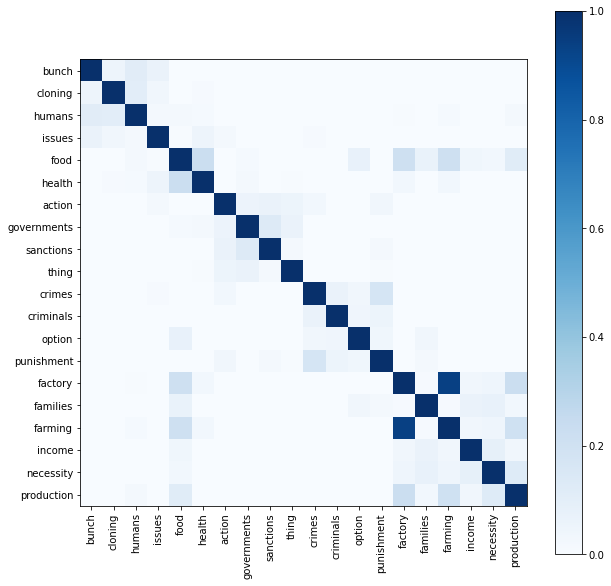

In [114]:
# compute cosine similarities among the first 20 weighted words

import numpy as np
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt

A=np.array(numpy_matrix)  # contains weighted word vectors


dist_out=1 - pairwise_distances(A[:20], metric="cosine")

# Create the heatmap
plt.figure(figsize=(10, 10))  
plt.imshow(dist_out, cmap='Blues', interpolation='nearest')
plt.colorbar()
plt.yticks(range(20), keys20, fontsize=10, rotation=0)  
plt.xticks(range(20), keys20, fontsize=10, rotation=90)  
plt.show()


In [115]:
sentences20=training_data.processed_text[:20]
sentences20

0     we should ban human cloning as it will only ca...
1     fast food should be banned because it is reall...
2     sometimes economic sanctions are the only thin...
3     capital punishment is sometimes the only optio...
4     factory farming allows for the production of c...
5     nuclear weapons help keep the peace in uncerta...
6     it should be allowed if the student wants to p...
7     three strike laws can cause young people to be...
8     adopting austerity regime will have very negat...
9     we should adopt an austerity regime because it...
10    gender neutral language is just another way to...
11    economic sanctions provide a non military sanc...
12    factory farming cuts too many health and safet...
13    it is important for news organizations to tran...
14    there are parades for every group and it is di...
15    children have not grown and truly formed their...
16    we should legalize prostitution because it wil...
17    embryonic stem cell research should be sub

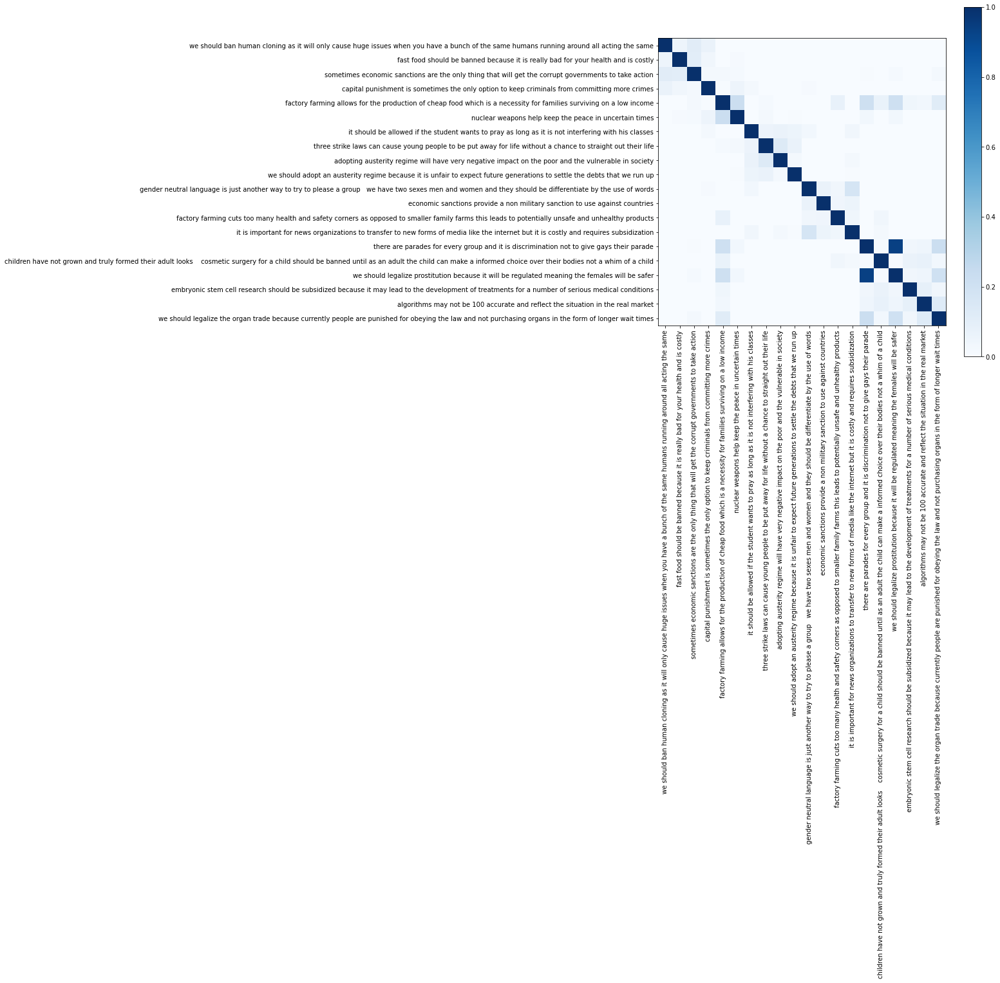

In [116]:
# compute cosine similarities among the first 20 weighted sentences

A=np.array(numpy_matrix)  # contains weighted word vectors

dist_out=1 - pairwise_distances(A[:20], metric="cosine")

# Create the heatmap
plt.figure(figsize=(10, 10))  
plt.imshow(dist_out, cmap='Blues', interpolation='nearest')
plt.colorbar()
plt.yticks(range(20), sentences20, fontsize=10, rotation=0)  
plt.xticks(range(20), sentences20, fontsize=10, rotation=90)  
plt.show()

## model

In [45]:
training_data["processed_text"]

0       we should ban human cloning as it will only ca...
1       fast food should be banned because it is reall...
2       sometimes economic sanctions are the only thin...
3       capital punishment is sometimes the only optio...
4       factory farming allows for the production of c...
                              ...                        
5387    on the one hand we have russia killing countle...
5388    the subsidies were originally intended to ensu...
5389    these products come mainly from large enterpri...
5390    subsidies often make farmers in recipient coun...
5391    the eu can not endlessly lean on america or na...
Name: processed_text, Length: 5392, dtype: object

In [46]:
training_data["label"]

0       [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1       [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, ...
2       [0.0, 0.0, 0.0, 0.0, 0.0, 0.5, 0.0, 0.0, 0.0, ...
3       [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4       [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.333...
                              ...                        
5387    [0.0, 0.0, 0.0, 0.0, 0.25, 0.25, 0.0, 0.0, 0.0...
5388    [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2, ...
5389    [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
5390    [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.166...
5391    [0.0, 0.25, 0.0, 0.0, 0.0, 0.25, 0.0, 0.0, 0.0...
Name: label, Length: 5392, dtype: object

In [47]:
# converting processed text and related labels to tuples in order to make it suitable for spacy

training_data['tuples'] = training_data.apply(
    lambda row: (row['processed_text'],row['label']), axis=1)
train = training_data['tuples'].tolist()
train[:1]

[('we should ban human cloning as it will only cause huge issues when you have a bunch of the same humans running around all acting the same',
  [0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   1.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0])]

In [48]:
train[2]

('sometimes economic sanctions are the only thing that will get the corrupt governments to take action',
 [0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.5,
  0.0,
  0.0,
  0.0,
  0.5,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0])